# **Introduction to Image Processing in Python**

> This tutorial provides an introduction to basic image processing techniques using the OpenCV computer vision library and some standard data analysis libraries in Python.

*Useful intro about [Colab](https://colab.research.google.com/notebooks/welcome.ipynb)*

*Useful intro about [OpenCV](https://docs.opencv.org/4.x/index.html)*








## Load the Dependencies

> This section loads some required libraries used in this notebook: **numpy**, **pandas**, **cv2**, **skimage**, **matplotlib**

*   [Numpy](https://www.numpy.org/) is an array manipulation library, used for linear algebra, Fourier transform, and random number capabilities.
*   [Pandas](https://pandas.pydata.org/) is a library for data manipulation and data analysis.
*   [CV2](https://docs.opencv.org/4.x/index.html) is a library for computer vision tasks.
*   [Skimage](https://scikit-image.org/) is a library which supports image processing applications on python.
*   [Matplotlib](https://matplotlib.org/) is a library which generates figures and provides graphical user interface toolkit.









In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
from PIL import Image
import matplotlib.pylab as plt

## Read Image from urls

> In this step we will read images from urls, and display them using openCV, please note the difference when reading image in RGB and BGR format. The default input color channels are in BGR format for openCV. But what happens when you do not specify?

In [ ]:
# Create a list to store the urls of the images
urls = ["https://umcms.um.edu.my/sites/universiti-malaya-convocation-ceremony/img/files/_AMR2577.jpg",
       "https://umcie.um.edu.my/img/files/kppi.jpg"]

# Read and display the image
# Loop over the image URLs, you could store several image urls in the list
for url in urls:
  image = io.imread(url) # Read the image from URL, return NumPy array in RGB format
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB) # Converts color space of image
  final_frame = cv.hconcat((image, image_2)) # Horizontally concatenates the original and color-converted images
  cv2_imshow(final_frame) # Display
  print('\n')

#### TODO: Read an image from a URL and display it

Image source examples:

[Google Image search](https://www.google.com/imghp?hl=en) - search for an image. Left-click one of the returned images, then right-click on the full image, and then select "Copy Image Address".

In [ ]:
# TODO: LOAD IMAGE
url = "https://upload-os-bbs.hoyolab.com/upload/2025/09/30/256962015/52db5b3f314702fc37232db2987e279e_3838041803198320995.png?x-oss-process=image%2Fresize%2Cs_1000%2Fauto-orient%2C0%2Finterlace%2C1%2Fformat%2Cwebp%2Fquality%2Cq_70"
myImg = io.imread(url)
cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))


## Arithmetic Operations

> Arithmetic operations are the foundational mathematical manipulations applied to pixel values in images. These include basic operations such as addition, subtraction, multiplication, and division. They are used for tasks like brightness adjustment, contrast enhancement, and combining multiple images. For instance, adding a constant value to all pixels can brighten an image, while subtracting can be used for contrast adjustments.

In [ ]:
# Read image
img1 = io.imread("https://umcms.um.edu.my/sites/universiti-malaya-convocation-ceremony/img/files/_AMR2577.jpg")
img2 = io.imread("https://umcie.um.edu.my/img/files/kppi.jpg")

# Display
cv2_imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
cv2_imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))

In [ ]:
# Resize images if they are not the same size
if img1.shape != img2.shape:
    img2 = cv.resize(img2, (img1.shape[1], img1.shape[0]))

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(img1.dtype)
# Check the height of image
print(img1.shape[0])
# Check the width of image
print(img1.shape[1])
# Check the number of channels of the image
print(img1.shape[2])

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(img2.dtype)
# Check the height of image
print(img2.shape[0])
# Check the width of image
print(img2.shape[1])
# Check the number of channels of the image
print(img2.shape[2])

In [ ]:
# Convert to Grayscale
img1_g = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
img2_g = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
cv2_imshow(img1_g)
cv2_imshow(img2_g)

### Addition

In [ ]:
# Perform addition
# Bright regions increase brightness in the final result
# Dark regions have little effect
# Resulting image appears brighter where both images have strong pixel intensity
added_image = cv.add(img1_g, img2_g)

plt.figure(figsize=(14, 8))
plt.subplot(131), plt.imshow(img1_g, cmap = 'gray')
plt.title('Image 1'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img2_g, cmap = 'gray')
plt.title('Image 2'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(added_image, cmap = 'gray')
plt.title('Added Image'), plt.xticks([]), plt.yticks([])
plt.show()

### Subtraction

In [ ]:
# Perform subtraction
# Highlights differences between two images
# Bright pixels in result represent ares where image 1 is brighter than image 2
# Black pixels show regions where they are similar or where image 2 dominates
sub_image = cv.subtract(img1_g, img2_g)

plt.figure(figsize=(14, 8))
plt.subplot(131), plt.imshow(img1_g, cmap = 'gray')
plt.title('Image 1'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img2_g, cmap = 'gray')
plt.title('Image 2'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(sub_image, cmap = 'gray')
plt.title('Subtracted Image'), plt.xticks([]), plt.yticks([])
plt.show()

#### TODO : Perform multiplication

In [ ]:
# Perform mulitplication
# Blend or mask by brightness
# Only show areas that are bright in both images
mult_image = cv.multiply(img1_g, img2_g, scale=1/255)

plt.figure(figsize=(14, 8))
plt.subplot(131), plt.imshow(img1_g, cmap='gray')
plt.title('Image 1'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img2_g, cmap='gray')
plt.title('Image 2'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(mult_image, cmap='gray')
plt.title('Multiplied Image'), plt.xticks([]), plt.yticks([])
plt.show()

## Set and Logical Operations

> Set and logical operations focus on manipulating sets of pixel values based on logical conditions. Common operations include AND, OR, and NOT, which help in binary image processing, masking, and image segmentation. These operations allow for the selective modification of pixel values based on specific criteria, making them essential for tasks like object detection and feature extraction.


##### Set Operations

In [ ]:
# Apply thresholding to convert grayscale image into binary masks
_, mask1 = cv.threshold(img1_g, 128, 255, cv.THRESH_BINARY)
_, mask2 = cv.threshold(img2_g, 128, 255, cv.THRESH_BINARY)

# Set Operations
# Intersection
# Keeps only the pixels that are white (255) in both masks
# Overlap of both white regions
# Where both images agree there is an object
intersection = cv.bitwise_and(mask1, mask2)

# Union
# Keeps pixels that are white in either image
# Combines both white regions
# Any object area in either image becomes white
union = cv.bitwise_or(mask1, mask2)

# Difference
# XOR - Symmetric Difference
# Keeps pixels that are white in one mask but not both
# Highlights non-overlapping parts of both masks
# Intersection becomes black
difference1 = cv.bitwise_xor(mask1, mask2)

# Remove pixels from mask1 that are also white in mask2
# Show only part of mask1 that does not overlap with mask2
# The reverse gives the opposite direction difference
difference2 = cv.subtract(mask1, mask2)
difference2reversed = cv.subtract(mask2, mask1)

# Display the images
plt.figure(figsize=(15, 10))

plt.subplot(331), plt.imshow(cv.cvtColor(img1_g, cv.COLOR_BGR2RGB))
plt.title('Image 1'), plt.xticks([]), plt.yticks([])
plt.subplot(332), plt.imshow(cv.cvtColor(img2_g, cv.COLOR_BGR2RGB))
plt.title('Image 2'), plt.xticks([]), plt.yticks([])
plt.subplot(333), plt.imshow(intersection, cmap='gray')
plt.title('Intersection'), plt.xticks([]), plt.yticks([])
plt.subplot(334), plt.imshow(union, cmap='gray')
plt.title('Union'), plt.xticks([]), plt.yticks([])
plt.subplot(335), plt.imshow(difference1, cmap='gray')
plt.title('Difference XOR (Image 1 - Image 2)'), plt.xticks([]), plt.yticks([])
plt.subplot(336), plt.imshow(difference2, cmap='gray')
plt.title('Difference (Image 2 - Image 1)'), plt.xticks([]), plt.yticks([])
plt.subplot(337), plt.imshow(difference2reversed, cmap='gray')
plt.title('Difference (Image 2 - Image 1)'), plt.xticks([]), plt.yticks([])

plt.show()

#### Logical Operations

In [ ]:
# Logical Operations
# Repeats similar operations under different name
# Logical instead of Set
logical_and = cv.bitwise_and(mask1, mask2) # White only where both masks are white
logical_or = cv.bitwise_or(mask1, mask2) # White where eithe rmask is white
logical_xor = cv.bitwise_xor(mask1, mask2) # White where exactly one mask is white
logical_not1 = cv.bitwise_not(mask1) # Shows areas that are not part of mask1 white regions
logical_not2 = cv.bitwise_not(mask2) # Shows areas that are not part of mask2 white regions

# Display the images
plt.figure(figsize=(15, 10))

plt.subplot(331), plt.imshow(cv.cvtColor(img1_g, cv.COLOR_BGR2RGB))
plt.title('Image 1'), plt.xticks([]), plt.yticks([])
plt.subplot(332), plt.imshow(cv.cvtColor(img2_g, cv.COLOR_BGR2RGB))
plt.title('Image 2'), plt.xticks([]), plt.yticks([])
plt.subplot(333), plt.imshow(logical_and, cmap='gray')
plt.title('Logical AND'), plt.xticks([]), plt.yticks([])
plt.subplot(334), plt.imshow(logical_or, cmap='gray')
plt.title('Logical OR'), plt.xticks([]), plt.yticks([])
plt.subplot(335), plt.imshow(logical_xor, cmap='gray')
plt.title('Logical XOR'), plt.xticks([]), plt.yticks([])
plt.subplot(336), plt.imshow(logical_not1, cmap='gray')
plt.title('Logical NOT (Image 1)'), plt.xticks([]), plt.yticks([])
plt.subplot(337), plt.imshow(logical_not2, cmap='gray')
plt.title('Logical NOT (Image 2)'), plt.xticks([]), plt.yticks([])

plt.show()

#### TODO : Perform other Set and Logical Operations

In [ ]:
# Black where two masks overlap, white everywhere else
# Opposite of intersection
nand_result = cv.bitwise_not(cv.bitwise_and(mask1, mask2))

# Mostly black, only background ares where both were 0 remain white
# Opposite of union
nor_result = cv.bitwise_not(cv.bitwise_or(mask1, mask2))

# White where both images have same value (both white or both black), black where they differ
# Overlapping white, overlapping black -> White
# Non-overlapping areas -> Black
xnor_result = cv.bitwise_not(cv.bitwise_xor(mask1, mask2))

plt.figure(figsize=(15, 5))

plt.subplot(131), plt.imshow(nand_result, cmap='gray')
plt.title('NAND'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(nor_result, cmap='gray')
plt.title('NOR'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(xnor_result, cmap='gray')
plt.title('XNOR'), plt.xticks([]), plt.yticks([])

plt.show()

## Spatial Operations

> Spatial operations refer to techniques that manipulate images based on the spatial arrangement of pixels. This includes geometric transformations such as translation, rotation, and scaling, as well as spatial filtering techniques like convolution and blurring. Spatial operations are critical for correcting image distortions, enhancing features, and preparing images for further analysis.


##### Blurring and Sharpening

In [ ]:
# Load and display image
imgN = io.imread("https://img.freepik.com/premium-photo/cute-little-kitten-playing-with-colorful-wool-balls-concept-love-animals-pets-generative-ai_853928-216.jpg")
imgN_g = cv.cvtColor(imgN, cv.COLOR_BGR2GRAY)

cv2_imshow(cv.cvtColor(imgN, cv.COLOR_BGR2RGB))

In [ ]:
# Define a kernel for spatial operations
# Convolutions: Combines two functions to produce a third, where each new value is a weighted average of the other function, considering the overlap between them

# For each pixel, output is average of its 5x5 neighborhood
# Smooths image, removing noise, softening edges, reducing details
# Example: 5x5 Gaussian kernel for blurring
kernel_blur = np.ones((5, 5), np.float32) / 25

# Central pixel's intensity is amplified
# Neighboring pixel intensities are subtracted (edge emphasis)
# Enhances fine details and edges, producing crisper image
# Example: 3x3 sharpening kernel
kernel_sharpen = np.array([[0, -1, 0],
                            [-1, 5, -1],
                            [0, -1, 0]])

# cv.filter2D() applies convolution between image and kernel
# -1 params means keep the same image depth
# Replaces each pixel with the weighted average of its neighborhood
# Smooth transitions, reduced noise and detailed, useful for preprocessing
# Perform blurring
blurred_image = cv.filter2D(imgN_g, -1, kernel_blur)

# Increase local contrast and edge strength
# Central pixel gets boosted by its own value minus contributions from neighbors
# Edges and textures pop
# Fine details become more visible
# Too much sharpening can cause noise or halos
# Perform sharpening
sharpened_image = cv.filter2D(imgN_g, -1, kernel_sharpen)

# Display the images
plt.figure(figsize=(15, 10))

plt.subplot(221), plt.imshow(cv.cvtColor(imgN, cv.COLOR_BGR2RGB))
plt.title('Original Image'), plt.xticks([]), plt.yticks([])

plt.subplot(222), plt.imshow(imgN_g, cmap='gray')
plt.title('Grayscale Image'), plt.xticks([]), plt.yticks([])

plt.subplot(223), plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image'), plt.xticks([]), plt.yticks([])

plt.subplot(224), plt.imshow(sharpened_image, cmap='gray')
plt.title('Sharpened Image'), plt.xticks([]), plt.yticks([])

plt.show()

#### TODO : Perform other Spatial Operations

In [ ]:
# TODO: Perform other Spatial Operations
# Edge detection kernels
# Detect vertical edges (changes along x-axis)
# Vertical lines or boundaries become visible
# Left-to-right intensity changes appear bright, right-to-left become dark
kernel_sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

# Detect horizontal edges (changes along y-axis)
# Horizontal lines become visible
# Bright bands represent upward intensity transitions, dark bands represent downward transitions
kernel_sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

# Detect edges in all directions based on second derivative
# Detect regions of rapid intensity change (edges, corners, fine details)
kernel_laplacian = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])

# Apply kernels (filters / convolution)
sobel_x = cv.filter2D(imgN_g, -1, kernel_sobel_x)
sobel_y = cv.filter2D(imgN_g, -1, kernel_sobel_y)

# Combines both horizontal and vertical edges into unified edge map
# Produces a strong response wherever there's a significant change in intensity in any direction
sobel_combined = cv.magnitude(sobel_x.astype(np.float32), sobel_y.astype(np.float32))
laplacian = cv.filter2D(imgN_g, -1, kernel_laplacian)

plt.figure(figsize=(16, 8))

plt.subplot(231), plt.imshow(imgN_g, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel X (Vertical Edges)'), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(sobel_y, cmap='gray')
plt.title('Sobel Y (Horizontal Edges)'), plt.xticks([]), plt.yticks([])
plt.subplot(234), plt.imshow(sobel_combined, cmap='gray')
plt.title('Sobel Combined'), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian (All Edges)'), plt.xticks([]), plt.yticks([])

plt.show()


## Vector Operations

> Vectors and matrices are fundamental structures in image processing, representing image data in mathematical form. Operations on vectors and matrices, such as addition, multiplication, and inversion, are essential for performing tasks like image transformations, filtering, and feature extraction. Understanding these operations enables efficient manipulation of multi-dimensional image data.


#### Image Inversion

In [ ]:
# Invert the image
# White becomes black
# Black becomes white
# Blue becomes yellow
# Red becomes cyan
# Green becomes magenta
inverted_image = 255 - imgN

# Display the original and inverted images
plt.figure(figsize=(14, 8))

plt.subplot(1, 2, 1)
plt.imshow(imgN)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(inverted_image)
plt.title('Inverted Image')
plt.axis('off')

plt.show()

#### TODO : Perform other Vector Operations

In [ ]:
# TODO: Perform other Vector Operations
# Scaling intensity (Contrast adjustment)
contrast_increased = cv.convertScaleAbs(imgN, alpha = 1.5, beta = 0) # Alpha > 1: Increase contrast
contrast_decreased = cv.convertScaleAbs(imgN, alpha = 0.5, beta = 0) # Alpha < 1: Decrease contrast

# Brightness adjustment
brightness_increased = cv.convertScaleAbs(imgN, alpha = 1, beta = 50) # Beta > 0: Brighter
brightness_decreased = cv.convertScaleAbs(imgN, alpha = 1, beta = -50) # Beta < 0: Darker

# Gamma correction (non-linear)
# Adjust image brightness non-linearly to make it appear more natural to human eyes or to compensate for display characteristics
# Dark tones become brighter, while highlights remain nearly the same
# Human eyes perceive brightness logarithmically, not lienarly
# This compensates for that perceptual curve, making images look "right" on screens and in print
gamma = 2.2
inv_gamma = 1.0 / gamma # Used to linearize intensity values
table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
gamma_corrected = cv.LUT(imgN, table) # Lookup Table (LUT) is faster than power operation per pixel

plt.figure(figsize=(18, 8))

plt.subplot(231), plt.imshow(cv.cvtColor(imgN, cv.COLOR_BGR2RGB))
plt.title('Original'), plt.axis('off')
plt.subplot(232), plt.imshow(cv.cvtColor(contrast_increased, cv.COLOR_BGR2RGB))
plt.title('Contrast +'), plt.axis('off')
plt.subplot(233), plt.imshow(cv.cvtColor(brightness_increased, cv.COLOR_BGR2RGB))
plt.title('Brightness +'), plt.axis('off')
plt.subplot(234), plt.imshow(cv.cvtColor(contrast_decreased, cv.COLOR_BGR2RGB))
plt.title('Contrast -'), plt.axis('off')
plt.subplot(235), plt.imshow(cv.cvtColor(brightness_decreased, cv.COLOR_BGR2RGB))
plt.title('Brightness -'), plt.axis('off')
plt.subplot(236), plt.imshow(cv.cvtColor(gamma_corrected, cv.COLOR_BGR2RGB))
plt.title('Gamma Correction'), plt.axis('off')

plt.show()

## Probabilistic Method & Image Transform

> Image transforms are mathematical techniques used to convert images into different domains for analysis. Common transforms include the Fourier transform, which helps analyze frequency components, and the wavelet transform, used for multi-resolution analysis. Transforms facilitate tasks like image compression, noise reduction, and feature extraction by providing alternative representations of the image data.

### Image Contours and Histograms

In [36]:
myImg = io.imread("https://static.wikia.nocookie.net/zenless-zone-zero/images/b/bf/Agent_Banyue_In-Game.png/revision/latest?cb=20250929130254")

# Check the image matrix data type (could know the bit depth of the image)
print(myImg.dtype)
# Check the height of image
print(myImg.shape[0])
# Check the width of image
print(myImg.shape[1])
# Check the number of channels of the image
print(myImg.shape[2])

uint8
1332
1755
3


### Generate Histogram of color image and grayscale image
Sometimes you want to enhance the contrast in your image or expand the contrast in a particular region while sacrificing the detail in colors that don’t vary much, or don’t matter. A good tool to find interesting regions is the histogram. To create a histogram of our image data, we use the matplot.pylab `hist()` function.

More info: [Histogram](https://docs.opencv.org/4.x/d1/db7/tutorial_py_histogram_begins.html)

Display the histogram of all the pixels in the color image

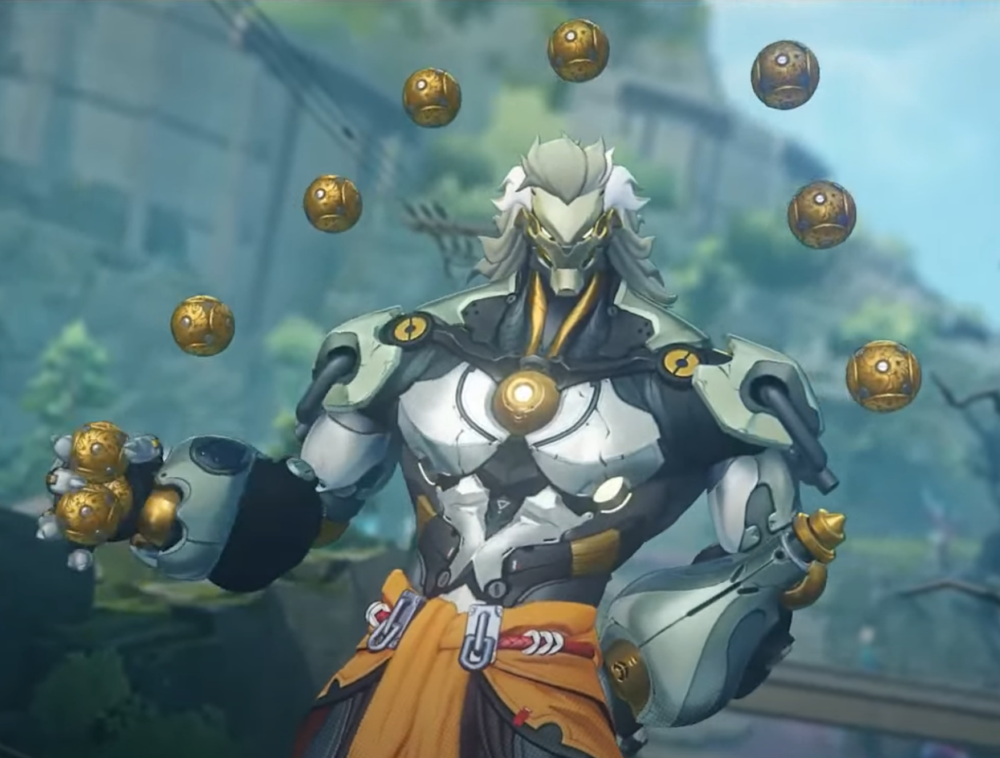

In [37]:
image = myImg;
cv2_imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))

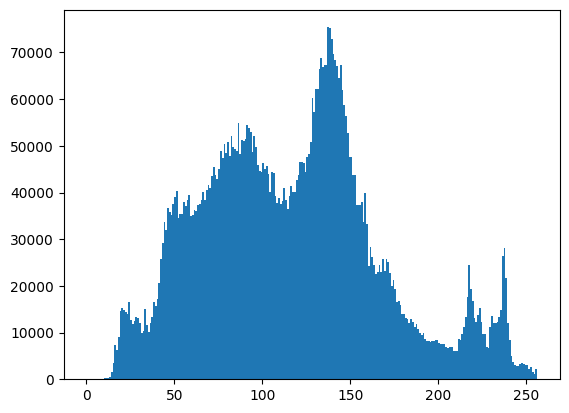

In [38]:
# Plot Histogram
# ravel() flattens a multi-dimensional array into 1D array
# To count pixel intensities linearly easier
# Left-skewed (near 0) - Dark image
# Right-skewed (near 255) - Bright image
# Centered (peaks midrange) - Balanced brightness, good exposure
# Narrow spike - Low contrast, flat tones, little variation
# Wide spread - High contrast, strong light-dark transitions
plt.hist(image.ravel(), bins = 256, range = [0, 256])
plt.show()

Display the histogram of R, G, B channel.

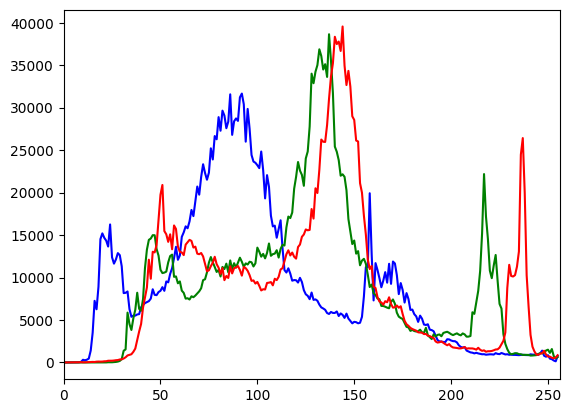

In [39]:
color = ('b','g','r')

for i, col in enumerate(color):
    # Histogram computation
    histr = cv.calcHist([image], [i], None, [256], [0,256])
    plt.plot(histr, color = col)
    plt.xlim([0, 256]) # Limits the x-axis to valid intensity values, prevent unwanted stretching beyond 0 - 255 range

plt.show()

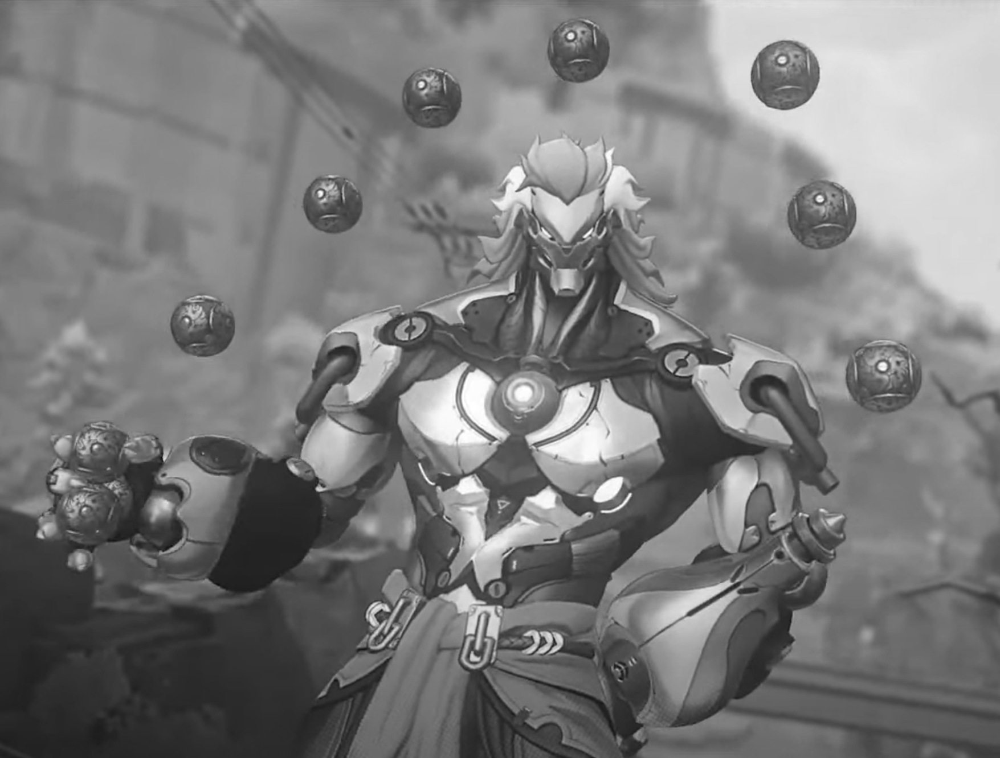

In [40]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

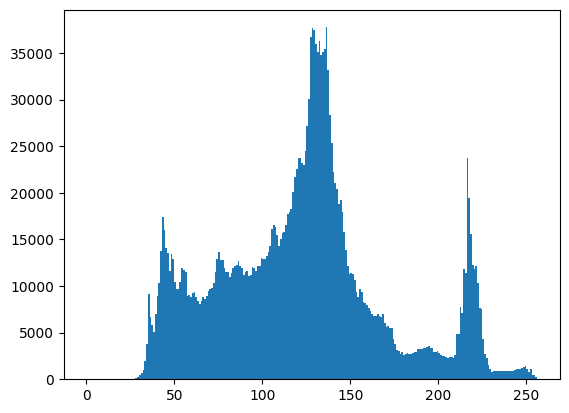

In [41]:
# Plot the histogram of the gray image.
# We could observe that the frequency of
# the image histogram has decreased ~ 1/3 of the histogram of color image
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

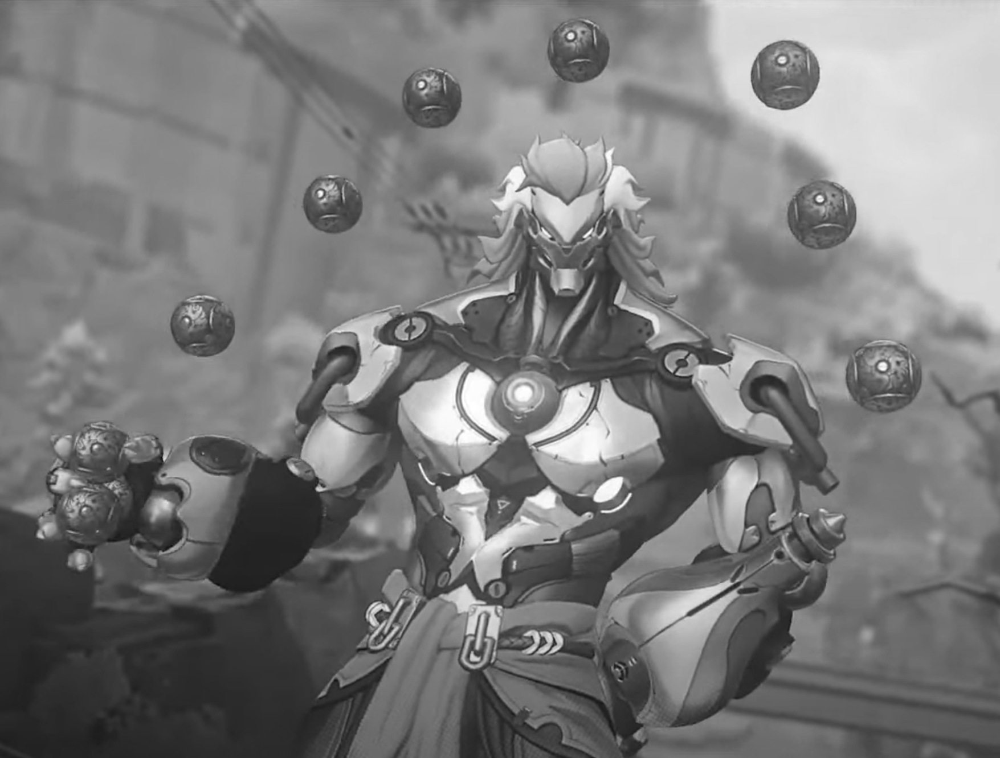

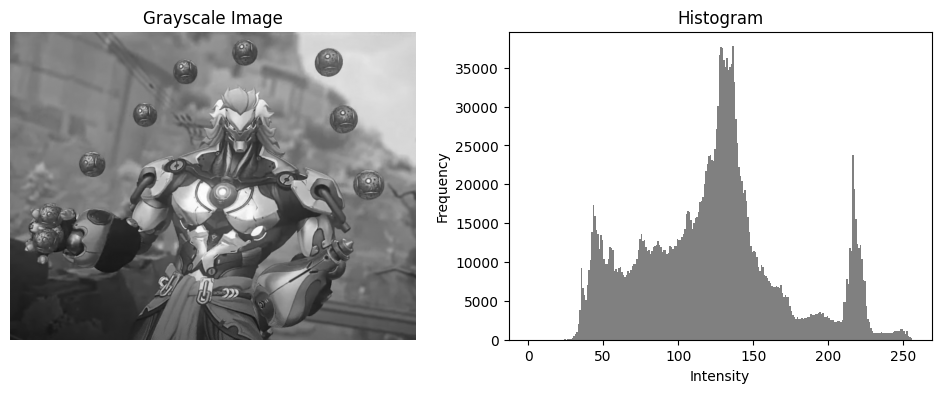

In [43]:
# TODO: Display the grayscale of your color image and generate histogram
myGrayImg = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
cv2_imshow(myGrayImg)

# Generate histogram
plt.figure(figsize=(12, 4))
plt.subplot(121), plt.imshow(myGrayImg, cmap='gray')
plt.title('Grayscale Image'), plt.axis('off')
plt.subplot(122), plt.hist(myGrayImg.ravel(), bins=256, range=[0, 256], color='gray')
plt.title('Histogram'), plt.xlabel('Intensity'), plt.ylabel('Frequency')
plt.show()

Method 1: Use the matplotlib. contour

More Info: [matplotlib contour](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.contour.html)

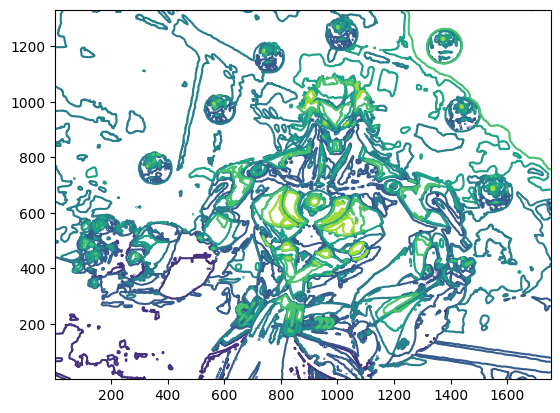

In [44]:
plt.contour(gray_image, origin = "image")

Method 2: Use the openCV lib

More info: [Contour](https://docs.opencv.org/3.1.0/d4/d73/tutorial_py_contours_begin.html)

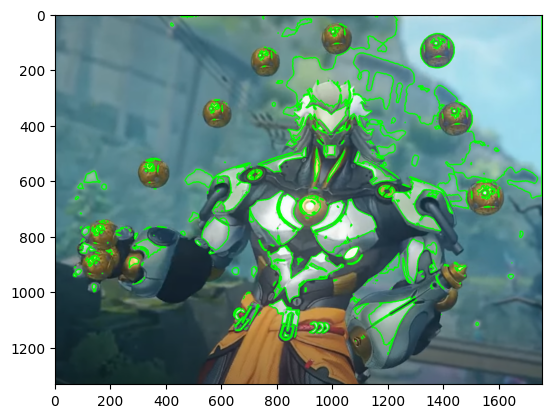

In [45]:
# Set threshold for the countour detection
ret, thresh = cv.threshold(gray_image,150,255,0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(image, contours, -1, (0, 255, 0), 3)
plt.imshow(image)

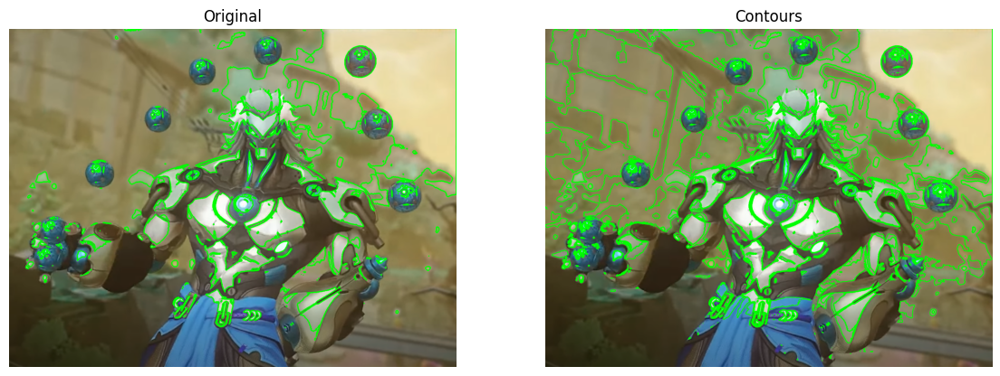

In [46]:
# TODO: Find the contour of your own image
myGrayImg = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(myGrayImg, 127, 255, cv.THRESH_BINARY)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

# Draw on copy to preserve original
contour_img = myImg.copy()
cv.drawContours(contour_img, contours, -1, (0, 255, 0), 2)

plt.figure(figsize=(14, 6))

plt.subplot(121), plt.imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))
plt.title('Original'), plt.axis('off')
plt.subplot(122), plt.imshow(cv.cvtColor(contour_img, cv.COLOR_BGR2RGB))
plt.title('Contours'), plt.axis('off')

plt.show()

### Grayscale Transform and Histogram Equalization


### Grayscale Transformation
This section provides some examples of conducting mathematical transformations of the grayscale image

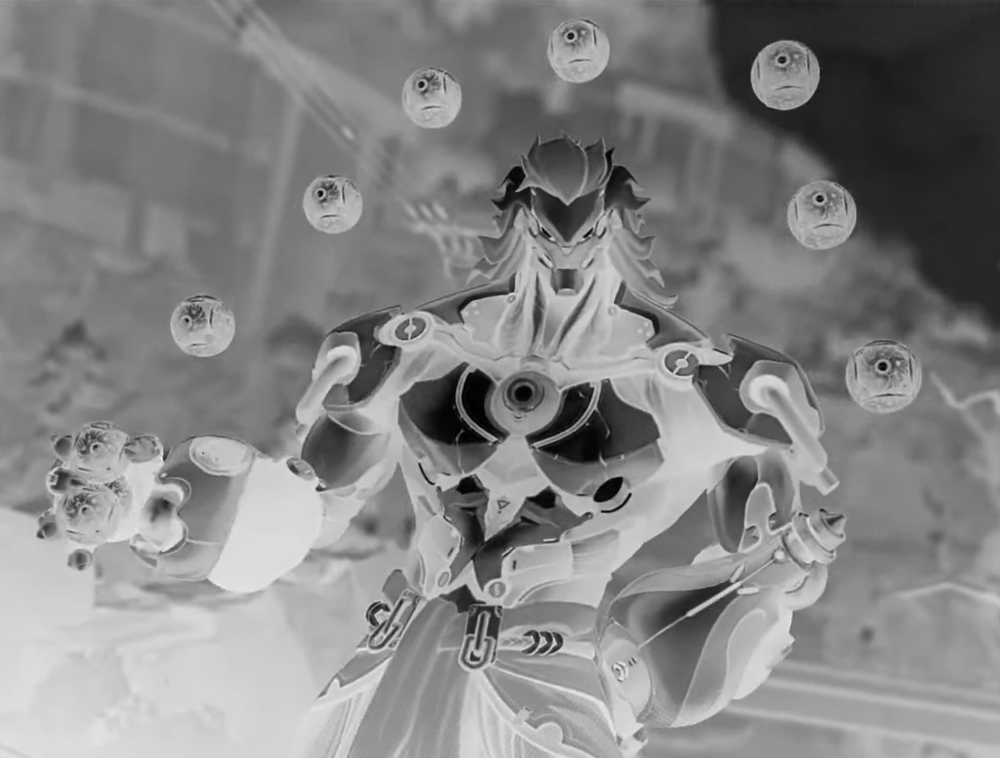

In [47]:
# This is an inverse operation of the grayscale image, you could see that the
# bright pixels become dark, and the dark pixels become bright
im2 = 255 - gray_image
cv2_imshow(im2)

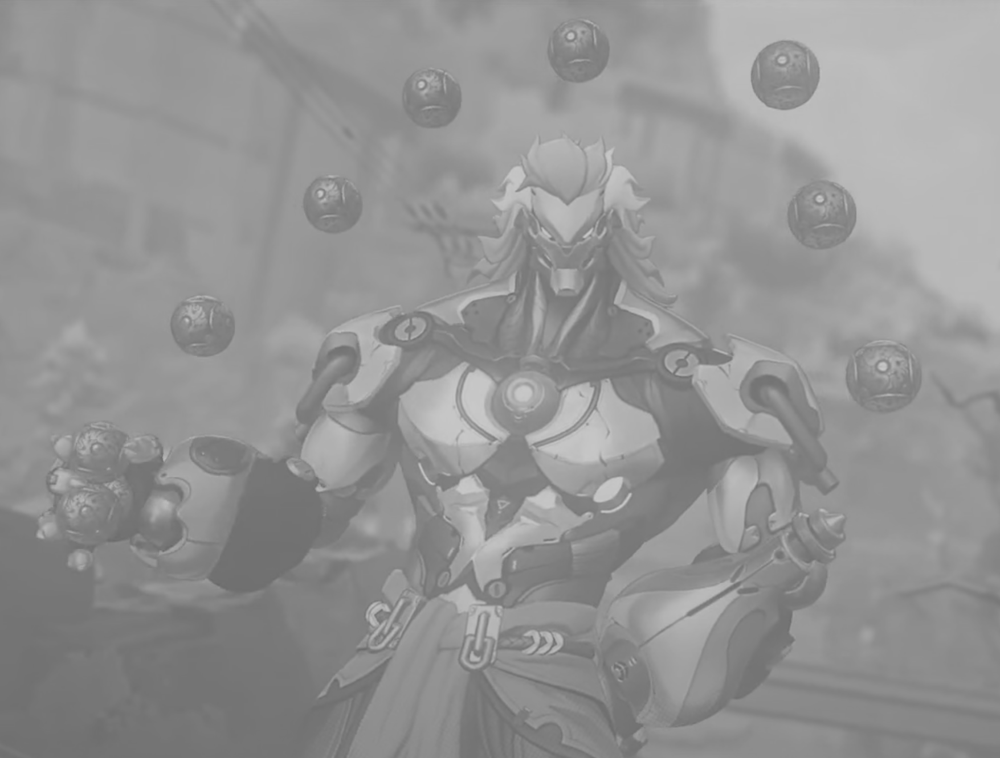

In [48]:
# Another transform of the image, after adding a constant,
# all the pixels become brighter and a hazing-like effect of the image is generated
im3 = (100.0 / 255) * gray_image + 100
cv2_imshow(im3)

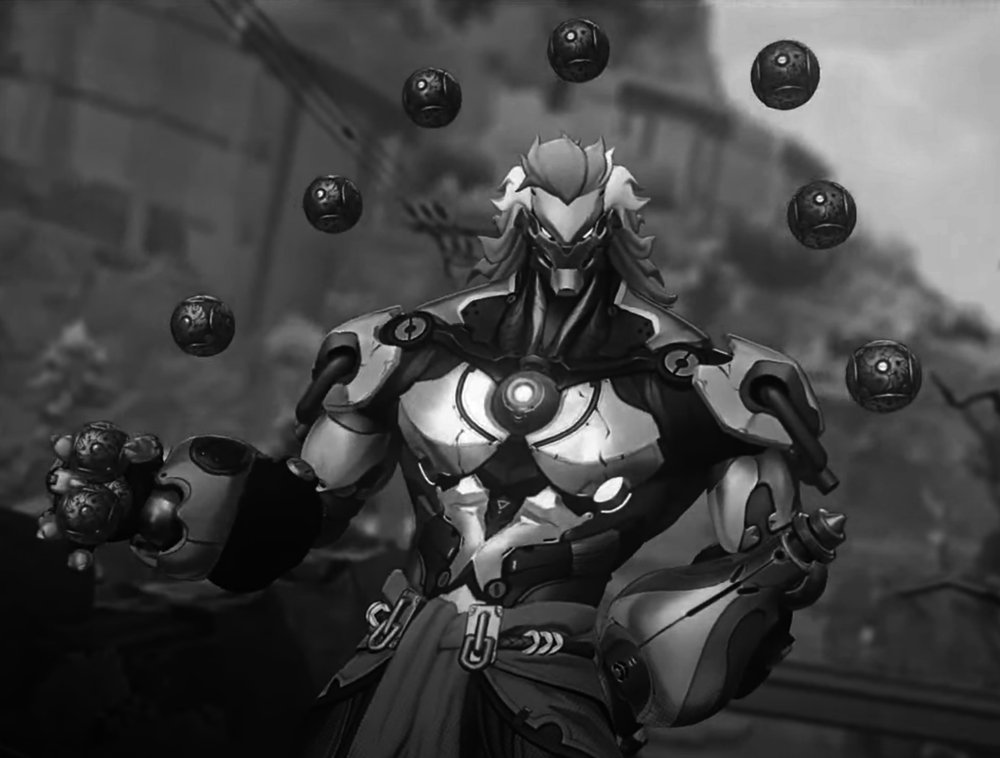

In [49]:
# The lightness level of the gray_image decreases after this step
im4 = 255.0 * (gray_image / 255.0) ** 2
cv2_imshow(im4)

#### TODO: Try some mathematical operations on your image


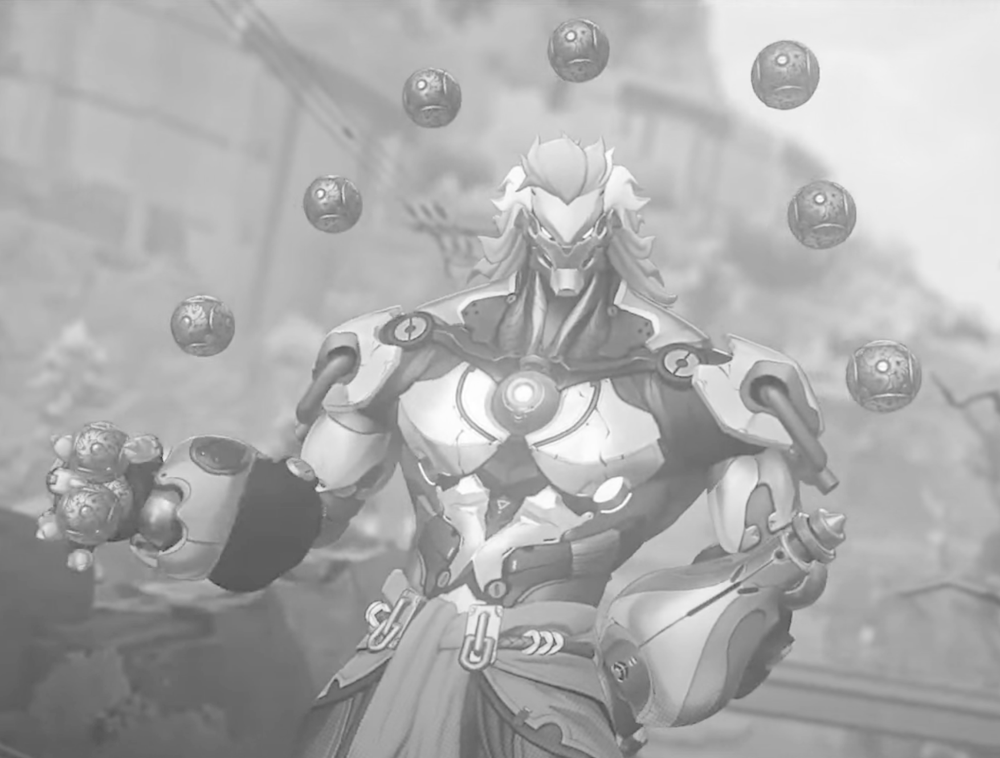

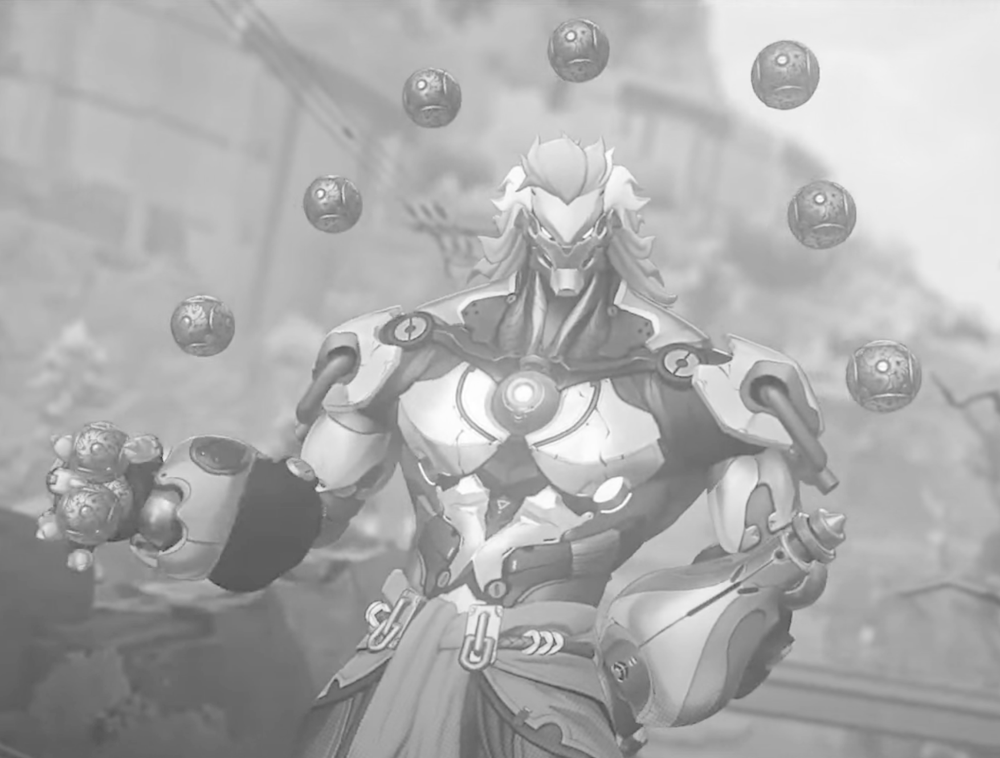

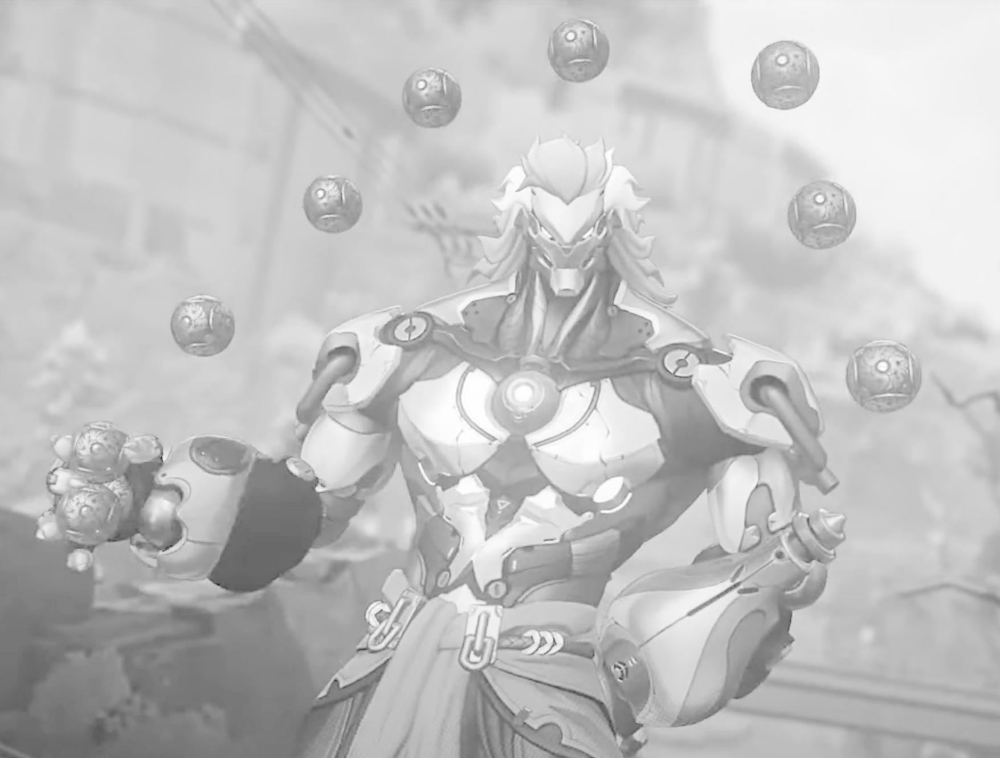

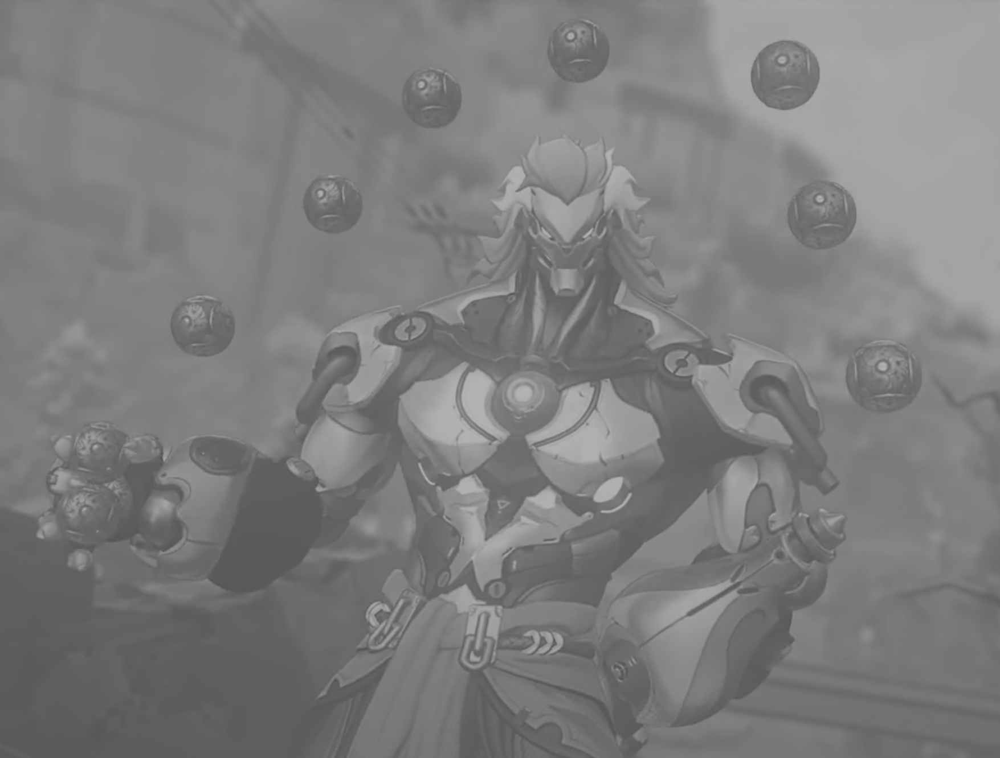

In [62]:
# TODO: Try some mathematical operations on your image
# Brightens or darkens nonlinearly
# Adjust midtones without clipping extremes
gamma = 0.5
im5 = np.array(255 * (gray_image / 255) ** gamma, dtype=np.uint8)
cv2_imshow(im5)

# Enhances low-intensity (dark) details while compressing highlights
# Better visibility in dark areas
sqrt_img = np.sqrt(gray_image / 255) * 255
cv2_imshow(np.uint8(sqrt_img))

# Boosts darker regions more than bright ones
# Useful for enhancing details in underexposed images
log_img = np.log1p(gray_image.astype(np.float32))
log_img = cv.normalize(log_img, None, 0, 255, cv.NORM_MINMAX)
cv2_imshow(np.uint8(log_img))

# Blends two images or transformations smoothly
# Creative combination of multiple effects
inverted = 255 - gray_image
blend = cv.addWeighted(gray_image, 0.7, inverted, 0.3, 0)
cv2_imshow(blend)

### Histogram Equalization
This section demonstrates histogram equalization on a dark image. This transform flattens the gray-level histogram so that all intensities are as equally common as possible. The transform function is a cumulative distribution function (cdf) of the pixel values in the image (normalized to map the range of pixel values to the desired range). This example uses image 4 (im4).

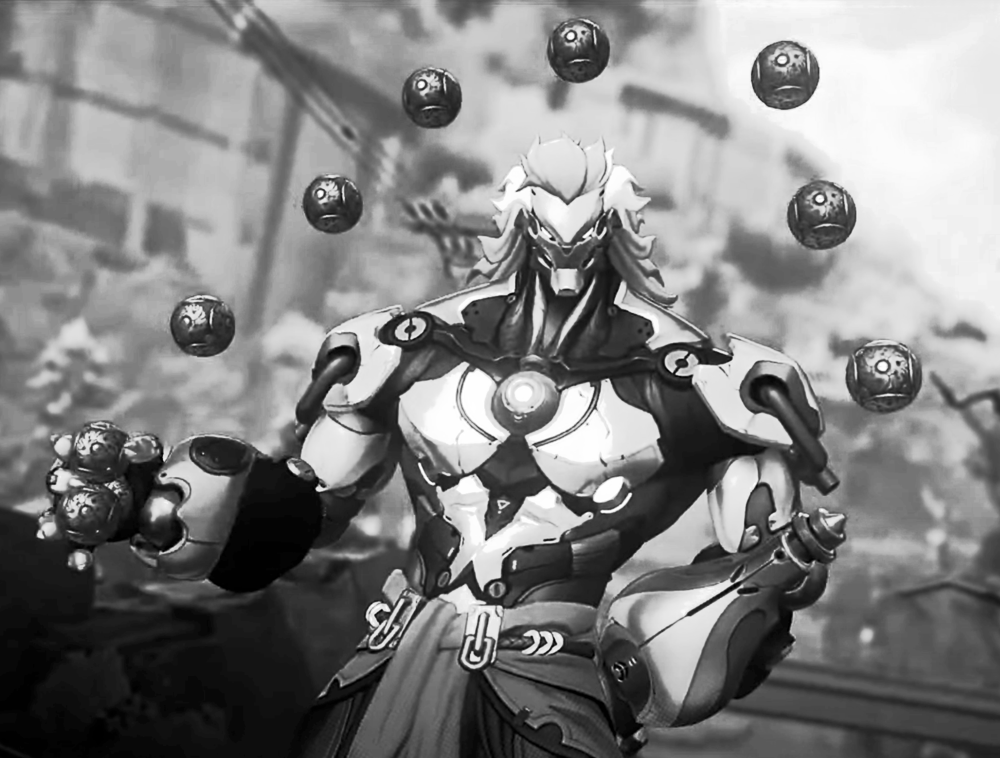

In [63]:
# Function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max() * cdf / cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min()) * 255 / (cdf_mask.max() - cdf_mask.min())
  cdf = np.ma.filled(cdf_mask, 0).astype('uint8')
  return cdf[im.astype('uint8')]

# Apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
im5 = histeq(im4)
cv2_imshow(im5)

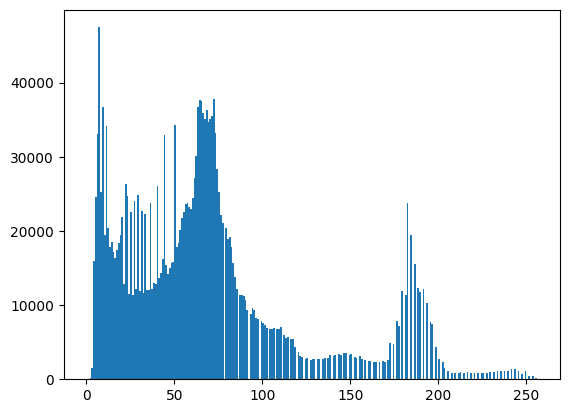

In [64]:
# Extra: try to visualize the histogram of the image after histogram equalization
# Before histogram equalization
plt.hist(im4.ravel(), bins = 256, range = [0, 256])
plt.show()

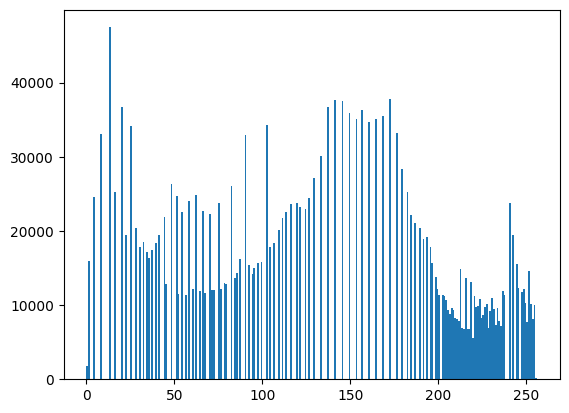

In [65]:
# After histogram equalization
plt.hist(im5.ravel(), bins = 256, range = [0, 256])
plt.show()

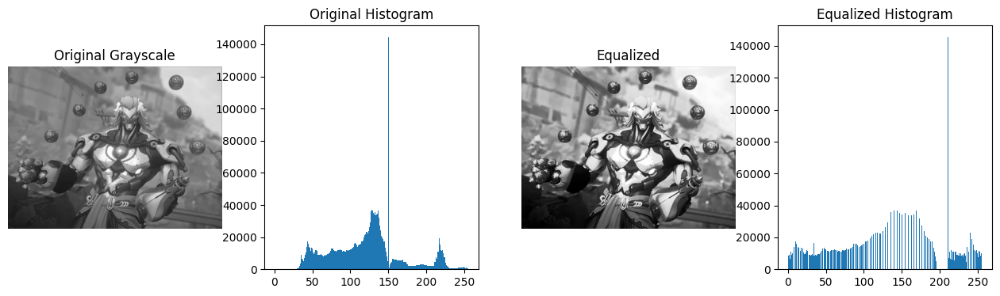

In [66]:
# TODO: Do a histogram equalization on your grayscale image
myGrayImgEq = histeq(myGrayImg)

plt.figure(figsize=(16, 4))

plt.subplot(141), plt.imshow(myGrayImg, cmap='gray')
plt.title('Original Grayscale'), plt.axis('off')
plt.subplot(142), plt.hist(myGrayImg.ravel(), bins=256, range=[0, 256])
plt.title('Original Histogram')
plt.subplot(143), plt.imshow(myGrayImgEq, cmap='gray')
plt.title('Equalized'), plt.axis('off')
plt.subplot(144), plt.hist(myGrayImgEq.ravel(), bins=256, range=[0, 256])
plt.title('Equalized Histogram')

plt.show()

### Fourier Transform of Gray Images
[FFT](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_transforms/py_fourier_transform/py_fourier_transform.html)
> A fourier transform is used to find the frequency domian of an image. You can consider an image as a signal which is sampled in two directions. So taking a fourier transform in both X and Y directions gives you the frequency representation of image. For the sinusoidal signal, if the amplitude varies so fast in short time, you can say it is a high frequency signal. If it varies slowly, it is a low frequency signal. Edges and noises are high frequency contents in an image because they change drastically in images.

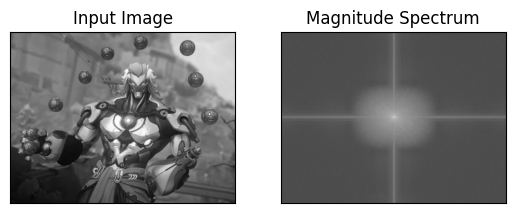

In [67]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

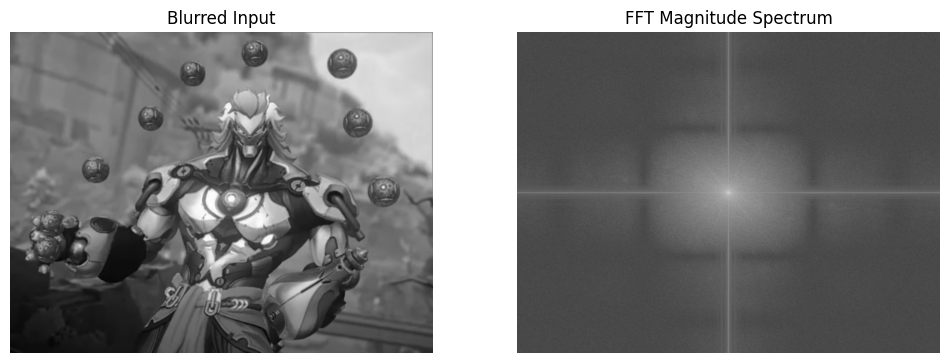

In [68]:
# TODO: Generate a Fourier Transform of your grayscale image
myImgBlur = cv.blur(myGrayImg, (5, 5))
f = np.fft.fft2(myImgBlur)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)  # +1 prevents log(0)

plt.figure(figsize=(12, 6))

plt.subplot(121), plt.imshow(myImgBlur, cmap='gray')
plt.title('Blurred Input'), plt.axis('off')
plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('FFT Magnitude Spectrum'), plt.axis('off')

plt.show()


### Finding Edges by Highpass Filtering in FFT

This section demonstrates conducting a high pass filter to remove the low frequency component, resulting in a sharpened image which contains the edges

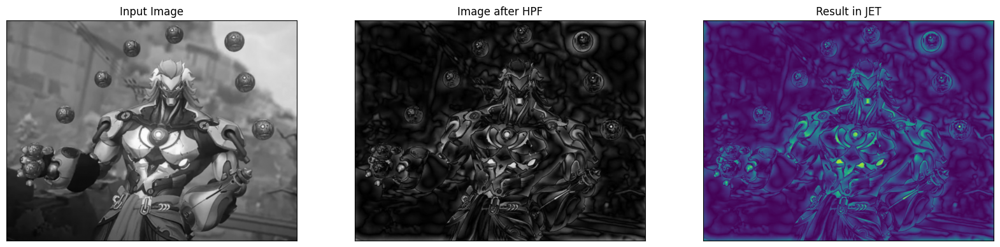

In [69]:
rows, cols = imBlur.shape
crow, ccol = round(rows/2) , round(cols/2)
# Remove low frequencies with a rectangle size of 20
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))

plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])

plt.show()